## Chicago Traffic Accident Map_2025






In [1]:
#  Install required libraries (run once)
!pip install osmnx geopandas folium branca pandas


In [2]:
#Import libraries
import os
import pandas as pd
import geopandas as gpd
import osmnx as ox
import folium
import branca.colormap as cm



In [3]:
#Adding chicago traffic csv data which I downloded from Chicago govt website

crashes = pd.read_csv("Traffic_Crashes_20251115.csv")

# Converting crash records to GeoDataFrame
crash_gdf = gpd.GeoDataFrame(
    crashes,
    geometry=gpd.points_from_xy(crashes["LONGITUDE"], crashes["LATITUDE"]),
    crs="EPSG:4326"
)


crash_gdf.head()


/var/folders/tn/qthxn6q95rd17mg5gsz5ctjh0000gq/T/ipykernel_9571/3258216460.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  crashes = pd.read_csv("Traffic_Crashes_20251115.csv")


,CRASH_RECORD_ID,CRASH_DATE_EST_I,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,...,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,geometry
0,04f52e7dd6cba4e59b164bc1b0a72914e02dcb72c1e8cb...,NaN,11/16/2025 02:53:00 AM,25,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ALLEY,...,0.0,1.0,0.0,2,1,11,41.843939,-87.728338,POINT (-87.728337854378 41.843938811471),POINT (-87.72834 41.84394)
1,74a5da421beb4d046a7c1bf5a9264c83661d9b758846b3...,NaN,11/16/2025 02:45:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",SIDESWIPE SAME DIRECTION,DIVIDED - W/MEDIAN (NOT RAISED),...,0.0,2.0,0.0,2,1,11,41.903590,-87.659213,POINT (-87.659213209195 41.903590314092),POINT (-87.65921 41.90359)
2,469e9b3f61e06160cedc3fab2f1c6b0474d5740081b9ad...,NaN,11/16/2025 02:30:00 AM,30,UNKNOWN,UNKNOWN,CLEAR,DARKNESS,SIDESWIPE SAME DIRECTION,UNKNOWN INTERSECTION TYPE,...,0.0,2.0,0.0,2,1,11,41.895049,-87.745956,POINT (-87.745955516269 41.895049037964),POINT (-87.74596 41.89505)
3,9e69f2b053b40e3044d61cf2edb96e8a4a187d27cdde17...,NaN,11/16/2025 01:30:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ONE-WAY,...,0.0,1.0,0.0,1,1,11,41.657918,-87.596296,POINT (-87.596296309543 41.657918181213),POINT (-87.5963 41.65792)
4,e736b23d346f4b4c5c96f35388f58a8c0cda11d0a955a3...,NaN,11/16/2025 01:30:00 AM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",TURNING,FOUR WAY,...,0.0,2.0,0.0,1,1,11,41.884352,-87.656788,POINT (-87.656787588102 41.884351914473),POINT (-87.65679 41.88435)


In [4]:
# Drop rows with missing or invalid coordinates
crashes = crashes.dropna(subset=["LATITUDE", "LONGITUDE"])

# Remove rows where lat/long are 0 or non-numeric 
crashes = crashes[
    (crashes["LATITUDE"] != 0) &
    (crashes["LONGITUDE"] != 0)
]
crashes = crashes[crashes["CRASH_DATE"].str.startswith("2024")]

# Convert to GeoDataFrame ( datum is crucial for my next steps )
crash_gdf = gpd.GeoDataFrame(
    crashes,
    geometry=gpd.points_from_xy(crashes["LONGITUDE"], crashes["LATITUDE"]),
    crs="EPSG:4326"
)


In [5]:
#lets see the colums so that I can see the colum name clearly. 
print(crashes.columns)


Index(['CRASH_RECORD_ID', 'CRASH_DATE_EST_I', 'CRASH_DATE',
       'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION',
       'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE',
       'TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT', 'ROADWAY_SURFACE_COND',
       'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE', 'INTERSECTION_RELATED_I',
       'NOT_RIGHT_OF_WAY_I', 'HIT_AND_RUN_I', 'DAMAGE', 'DATE_POLICE_NOTIFIED',
       'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO',
       'STREET_DIRECTION', 'STREET_NAME', 'BEAT_OF_OCCURRENCE',
       'PHOTOS_TAKEN_I', 'STATEMENTS_TAKEN_I', 'DOORING_I', 'WORK_ZONE_I',
       'WORK_ZONE_TYPE', 'WORKERS_PRESENT_I', 'NUM_UNITS',
       'MOST_SEVERE_INJURY', 'INJURIES_TOTAL', 'INJURIES_FATAL',
       'INJURIES_INCAPACITATING', 'INJURIES_NON_INCAPACITATING',
       'INJURIES_REPORTED_NOT_EVIDENT', 'INJURIES_NO_INDICATION',
       'INJURIES_UNKNOWN', 'CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'CRASH_MONTH',
       'LATITUDE', 

In [6]:
crashes = pd.read_csv("Traffic_Crashes_20251115.csv", low_memory=False)

In [7]:
#Lets do Download Chicago street network

import osmnx as ox

# Lets add the drivable street network for Chicago
G = ox.graph_from_place("Chicago, Illinois, USA", network_type="drive")
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

edges.head()

osmid        highway  \
u        v          key                                                  
702090   261263104  0                          24536463  motorway_link   
         1223297118 0             [1000818941, 8220086]       motorway   
25779161 739968328  0                           4378009       motorway   
25779173 709393011  0    [24229922, 56716748, 56716749]  motorway_link   
         25779174   0                         906195924       motorway   

                         oneway reversed      length  \
u        v          key                                
702090   261263104  0      True    False  323.562424   
         1223297118 0      True    False  713.144140   
25779161 739968328  0      True    False  376.541227   
25779173 709393011  0      True    False  676.727456   
         25779174   0      True    False  110.038748   

                                                                  geometry  \
u        v          key                                                      
702090   261263104  0    LINESTRING (-87.81782 41.98343, -87.81813 41.9...   
         1223297118 0    LINESTRING (-87.81782 41.98343, -87.81879 41.9...   
25779161 739968328  0    LINESTRING (-87.661 41.90109, -87.66088 41.900...   
25779173 709393011  0    LINESTRING (-87.65698 41.89495, -87.65687 41.8...   
         25779174   0    LINESTRING (-87.65698 41.89495, -87.65651 41.8...   

                        lanes maxspeed                name        ref bridge  \
u        v          key                                                        
702090   261263104  0     NaN      NaN                 NaN        NaN    NaN   
         1223297118 0       4   55 mph  Kennedy Expressway       I 90    NaN   
25779161 739968328  0       4   45 mph  Kennedy Expressway  I 90;I 94    NaN   
25779173 709393011  0       2      NaN                 NaN        NaN    yes   
         25779174   0       4   45 mph  Kennedy Expressway  I 90;I 94    NaN   

                        access tunnel width junction area  
u        v          key                                    
702090   261263104  0      NaN    NaN   NaN      NaN  NaN  
         1223297118 0      NaN    NaN   NaN      NaN  NaN  
25779161 739968328  0      NaN    NaN   NaN      NaN  NaN  
25779173 709393011  0      NaN    NaN   NaN      NaN  NaN  
         25779174   0      NaN    NaN   NaN      NaN  NaN

In [8]:
pip install shapely==1.8.5.post1


  Using cached Shapely-1.8.5.post1-cp310-cp310-macosx_10_9_x86_64.whl.metadata (43 kB)
Using cached Shapely-1.8.5.post1-cp310-cp310-macosx_10_9_x86_64.whl (1.2 MB)
  Attempting uninstall: shapely
    Found existing installation: shapely 2.1.2
    Uninstalling shapely-2.1.2:
      Successfully uninstalled shapely-2.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
geopandas 1.1.1 requires shapely>=2.0.0, but you have shapely 1.8.5.post1 which is incompatible.
osmnx 2.0.6 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
prettymaps 1.0.0 requires osmnx==1.2.2, but you have osmnx 2.0.6 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [9]:
!pip install --upgrade geopandas osmnx shapely





  Using cached shapely-2.1.2-cp310-cp310-macosx_10_9_x86_64.whl.metadata (6.8 kB)
Using cached shapely-2.1.2-cp310-cp310-macosx_10_9_x86_64.whl (1.8 MB)
  Attempting uninstall: shapely
    Found existing installation: Shapely 1.8.5.post1
    Uninstalling Shapely-1.8.5.post1:
      Successfully uninstalled Shapely-1.8.5.post1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
prettymaps 1.0.0 requires osmnx==1.2.2, but you have osmnx 2.0.6 which is incompatible.
prettymaps 1.0.0 requires Shapely<2.0,>=1.8, but you have shapely 2.1.2 which is incompatible.


In [10]:
import pandas as pd
import geopandas as gpd
import osmnx as ox
import folium
import branca.colormap as cm
from collections import Counter



In [11]:
# Adding and cleaning crash data
crashes = pd.read_csv("Traffic_Crashes_20251115.csv", low_memory=False)
crashes = crashes.dropna(subset=["LATITUDE", "LONGITUDE"])
crashes = crashes[
    (crashes["LATITUDE"].between(41.6, 42.1)) &
    (crashes["LONGITUDE"].between(-88.0, -87.5))
]

crash_gdf = gpd.GeoDataFrame(
    crashes,
    geometry=gpd.points_from_xy(crashes["LONGITUDE"], crashes["LATITUDE"]),
    crs="EPSG:4326"
)

In [12]:
# loading Chicago road network and clip to central area
G = ox.graph_from_place("Chicago, Illinois, USA", network_type="drive")
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

# Cliping manually to central Chicago
edges = edges.cx[-87.75:-87.60, 41.80:41.95]

In [13]:
# Reprojecting and match crashes to nearest edges
crash_gdf = crash_gdf.to_crs(edges.crs)
edges = edges.to_crs(edges.crs)

x = crash_gdf.geometry.x.values
y = crash_gdf.geometry.y.values
nearest_edges = ox.distance.nearest_edges(G, x, y)

edge_counts = Counter(nearest_edges)
edges["crash_count"] = edges.index.map(lambda idx: edge_counts.get(idx, 0))


In [14]:
# Filtering edges with crashes otherwise big data will impact my speed and taking lot of time to complete one run
edges = edges[edges["crash_count"] > 0]


In [15]:
print("Edges shape:", edges.shape)
print("Crash count column exists:", "crash_count" in edges.columns)
print("Crash count summary:\n", edges["crash_count"].describe() if "crash_count" in edges.columns else "No crash_count")


Edges shape: (22156, 17)
Crash count column exists: True
Crash count summary:
 count    22156.000000
mean        21.070139
std         35.000014
min          1.000000
25%          3.000000
50%          9.000000
75%         23.000000
max       1037.000000
Name: crash_count, dtype: float64


<AxesSubplot: >

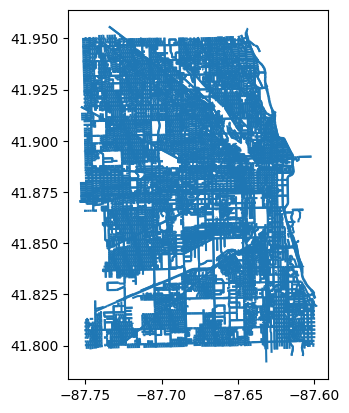

In [16]:

#lets check the length of accident data
len(edges)
edges.plot()

In [17]:
# After matching crashes to edges and calculating crash_count
edges["crash_density"] = edges["crash_count"]  # or any normalized field

# Lets do save to GeoJSON
edges.to_file("chicago_crash_roads.geojson", driver="GeoJSON")



In [18]:
gdf = gpd.read_file("chicago_crash_roads.geojson")


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field bridge: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5


In [19]:

# lets see the crash density column for finding better scale 
print("Minimum accidents:", gdf["crash_density"].min())
print("Maximum accidents:", gdf["crash_density"].max())

# Or lets get a quick summary
print(gdf["crash_density"].describe())


Minimum accidents: 1
Maximum accidents: 1037
count    22156.000000
mean        21.070139
std         35.000014
min          1.000000
25%          3.000000
50%          9.000000
75%         23.000000
max       1037.000000
Name: crash_density, dtype: float64


In [20]:
# Now I here min accident is 1 and max is 1037 so I am going to keep 400 low and 1037 for high in hotsopt
# loading and clean GeoJSON
gdf = gpd.read_file("chicago_crash_roads.geojson")
gdf = gdf.drop(columns=["highway", "lanes", "maxspeed", "name", "bridge", "tunnel"], errors="ignore")
gdf["crash_density"] = gdf["crash_density"].fillna(0)

# lets clip to central Chicago
gdf = gdf.cx[-87.75:-87.60, 41.80:41.95]

#  Defining colormap for roads (green → red, 10 steps, scale 100–1037)
road_colormap = cm.LinearColormap(
    colors=list(reversed(cm.linear.RdYlGn_11.colors)),
    vmin=100,
    vmax=1037
).to_step(10)

# defineing colormap for hotspots (orange → dark red, ≥400 accidents)
hotspot_colormap = cm.LinearColormap(
    colors=["yellow", "red", "darkred"],
    vmin=400,
    vmax=1037
)

# center map Cartography
minx, miny, maxx, maxy = gdf.total_bounds
center = [(miny + maxy) / 2, (minx + maxx) / 2]

m = folium.Map(location=center, zoom_start=13, tiles="CartoDB positron")

# road segments styled by crash density
folium.GeoJson(
    gdf,
    style_function=lambda feature: {
        "color": road_colormap(feature["properties"]["crash_density"]),
        "weight": 2 + (feature["properties"]["crash_density"] / 150),
        "opacity": 0.9
    }
).add_to(m)

# hotspot markers (≥400 accidents)
hotspots = gdf[gdf["crash_density"] >= 400]
for _, row in hotspots.iterrows():
    centroid = row.geometry.centroid
    folium.CircleMarker(
        location=[centroid.y, centroid.x],
        radius=6,
        color=hotspot_colormap(row["crash_density"]),
        fill=True,
        fill_color=hotspot_colormap(row["crash_density"]),
        fill_opacity=0.8,
        popup=f"Hotspot: {row['crash_density']} accidents"
    ).add_to(m)

#  legends (both on right side)
road_colormap.caption = "Road crash density (100–1037)"
road_colormap.add_to(m)

hotspot_colormap.caption = "Hotspot density (yellow → dark red)"
hotspot_colormap.add_to(m)

#  heading 
title_html = """
<h1 align="center" style="font-size:28px; color:#2C3E50;">
<b>Chicago Traffic Accident Hotspots</b>
</h1>
"""
m.get_root().html.add_child(folium.Element(title_html))

# lets make it fit bounds and save
m.fit_bounds([[miny, minx], [maxy, maxx]])
m.save("chicago_accidents_hotspots_2025.html")


m


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field bridge: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5
